# Plant Disease Classification Model

This project aims to build a deep learning model for classifying plant diseases based on leaf images. The model is trained on a dataset of plant images with corresponding disease labels.

Dataset found on: https://data.mendeley.com/datasets/tywbtsjrjv/1

### Importing Required Libraries

In [51]:
# Standard libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

# Image processing
import cv2
import seaborn as sns

# TensorFlow and Keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras import backend
from keras.callbacks import ReduceLROnPlateau

# Scikit-learn
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split

### Loading and Preprocessing Data

In [52]:
plant_images = np.load('/Users/ansh_is_g/Plant_Disease_Classification_Model/images_data.npy')

plant_labels = pd.read_csv('/Users/ansh_is_g/Plant_Disease_Classification_Model/image_labels.csv')

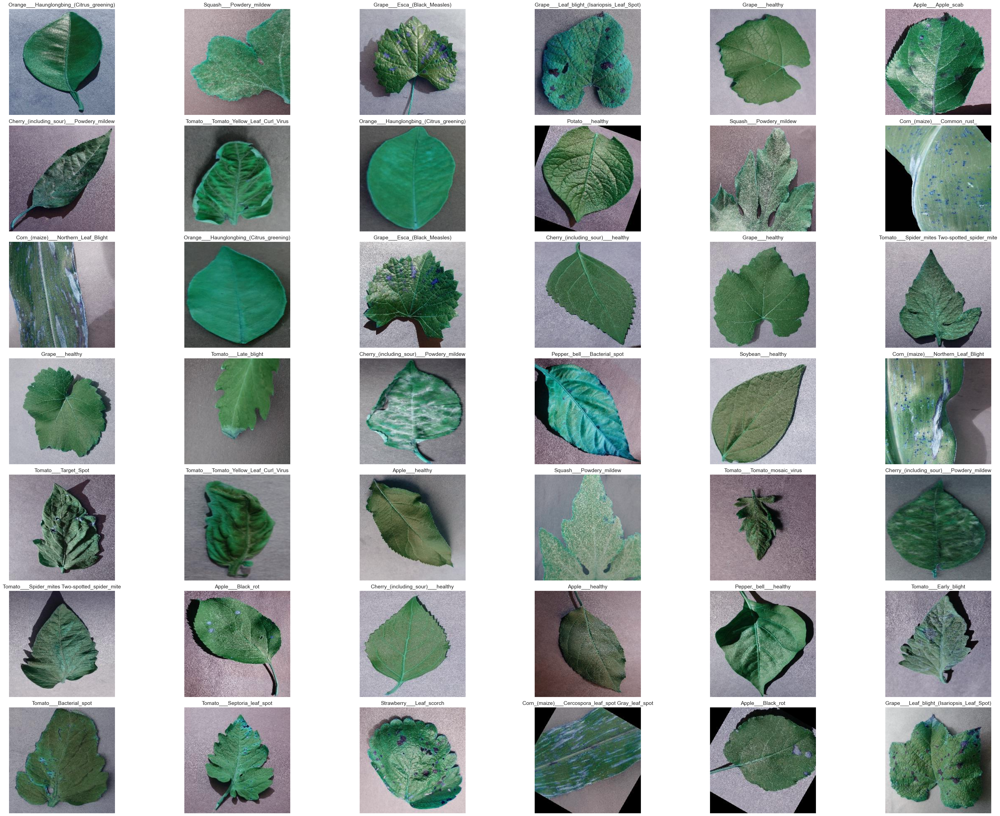

In [53]:
# Function to display sample images from the dataset
def show_images(images, labels):
    label_dict = labels['Label'].to_dict()
    rows = 7
    cols = 6
    fig, axes = plt.subplots(rows, cols, figsize=(40, 30))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    for row in range(rows):
        for col in range(cols):
            idx = np.random.randint(0, len(labels))
            ax = axes[row, col]
            ax.imshow(images[idx])
            ax.set_title(label_dict[idx], fontsize=14)
            ax.set_xticks([])
            ax.set_yticks([])

    plt.tight_layout()
    plt.show()

show_images(plant_images, plant_labels)

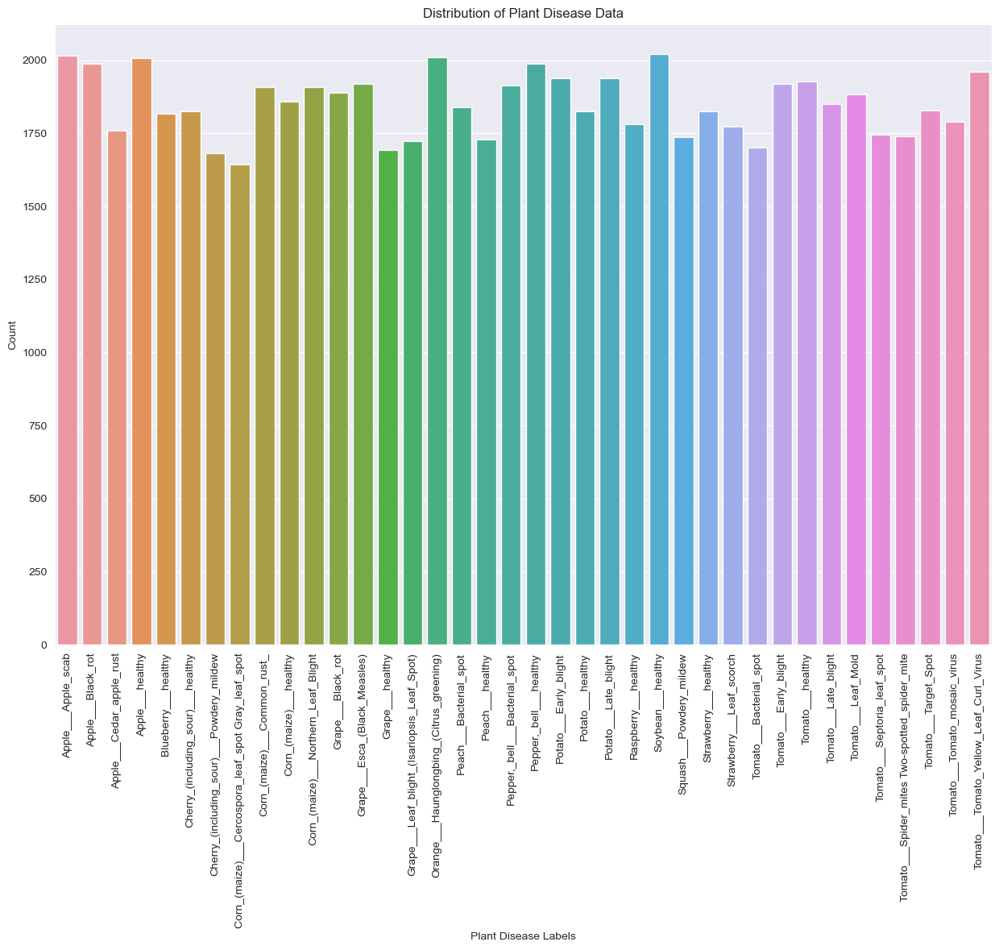

In [54]:
# Visualizing the distribution of plant disease labels
plt.figure(figsize=(15, 10))
sns.countplot(x='Label', data=plant_labels)
plt.xticks(rotation=90)
plt.xlabel('Plant Disease Labels')
plt.ylabel('Count')
plt.title('Distribution of Plant Disease Data')
plt.show()

In [55]:
# Converting all the images from BGR to RGB 
for i in range(len(plant_images)):
    plant_images[i] = cv2.cvtColor(plant_images[i], cv2.COLOR_BGR2RGB)

In [56]:
# Resize images to a fixed target size
resized_images = []
target_size = 64

for img in plant_images:
    resized_img = cv2.resize(img, (target_size, target_size), interpolation=cv2.INTER_LINEAR)
    resized_images.append(resized_img)

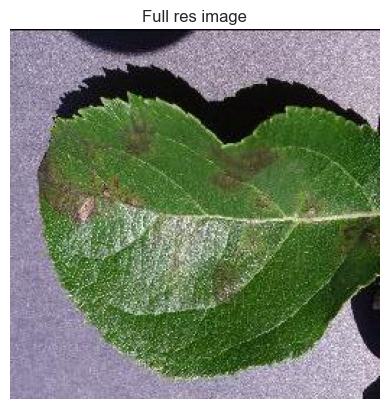

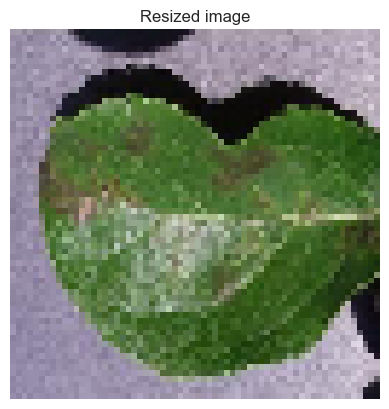

In [57]:
# Display a comparision of a sample full-res and resized, 64x64 image
plt.imshow(plant_images[123])
plt.title('Full res image')
plt.axis('off')
plt.show()

plt.imshow(resized_images[123])
plt.title('Resized image')
plt.axis('off')
plt.show()

In [58]:
# Splitting the data into train, validation, and test sets
X_temp, X_test, y_temp, y_test = train_test_split(np.array(resized_images), plant_labels['Label'], test_size=0.1, random_state=2005, stratify=plant_labels['Label'])

X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1, random_state=2005, stratify=y_temp)

In [59]:
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(56938, 64, 64, 3) (56938,)
(6327, 64, 64, 3) (6327,)
(7030, 64, 64, 3) (7030,)


In [60]:
normalized_X_train = X_train.astype('float32') / 255.0
normalized_X_val = X_val.astype('float32') / 255.0
normalized_X_test = X_test.astype('float32') / 255.0

In [61]:
label_binarizer = LabelBinarizer()
y_train_encoded = label_binarizer.fit_transform(y_train)
y_val_encoded = label_binarizer.transform(y_val)
y_test_encoded = label_binarizer.transform(y_test)


print(y_train_encoded.shape)
print(y_val_encoded.shape)
print(y_test_encoded.shape)

### Building and Training the Models

Model 1

In [63]:
backend.clear_session()

In [64]:
#Setting random seeds for reproducibility
np.random.seed(2005)
random.seed(2005)
tf.random.set_seed(2005)

In [65]:
model1 = Sequential([
    Conv2D(target_size, (3, 3), activation='relu', padding="same", input_shape=(target_size, target_size, 3)),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(64, (3, 3), activation='relu', padding="same"),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(32, (3, 3), activation='relu', padding="same"),
    MaxPooling2D((2, 2), padding='same'),
    Flatten(),
    Dense(16, activation='relu'),
    Dropout(0.3),
    Dense(38, activation='softmax')
])

model1.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 64)        1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 64)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 32)        18464     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 8, 8, 32)          0

In [66]:
#Training the first model
history_1 = model1.fit(
    normalized_X_train, y_train_encoded,
    epochs=75,
    validation_data=(normalized_X_val,y_val_encoded),
    batch_size=32,
    verbose=2
)

Epoch 1/75
1780/1780 - 104s - loss: 3.0391 - accuracy: 0.1370 - val_loss: 2.3586 - val_accuracy: 0.3180 - 104s/epoch - 58ms/step
Epoch 2/75
1780/1780 - 87s - loss: 2.3461 - accuracy: 0.2761 - val_loss: 1.6647 - val_accuracy: 0.5375 - 87s/epoch - 49ms/step
Epoch 3/75
1780/1780 - 89s - loss: 2.0994 - accuracy: 0.3380 - val_loss: 1.4944 - val_accuracy: 0.5801 - 89s/epoch - 50ms/step
Epoch 4/75
1780/1780 - 86s - loss: 1.9836 - accuracy: 0.3667 - val_loss: 1.3558 - val_accuracy: 0.6377 - 86s/epoch - 48ms/step
Epoch 5/75
1780/1780 - 97s - loss: 1.8484 - accuracy: 0.4108 - val_loss: 1.2206 - val_accuracy: 0.6596 - 97s/epoch - 54ms/step
Epoch 6/75
1780/1780 - 86s - loss: 1.7553 - accuracy: 0.4367 - val_loss: 1.0963 - val_accuracy: 0.6995 - 86s/epoch - 48ms/step
Epoch 7/75
1780/1780 - 85s - loss: 1.6734 - accuracy: 0.4613 - val_loss: 1.0015 - val_accuracy: 0.7293 - 85s/epoch - 48ms/step
Epoch 8/75
1780/1780 - 83s - loss: 1.6285 - accuracy: 0.4760 - val_loss: 1.0131 - val_accuracy: 0.7357 - 83s/

In [67]:
model_file = "model_1_75epochs.h5"
model1.save(model_file)

print(f"Model saved as {model_file}")
print("Training completed.")

Model saved as model_1_75epochs.h5
Training completed.


/Users/ansh_is_g/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## Creating a new Model to reduce the loss

In [68]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=3,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

In [69]:
from tensorflow.keras import backend
backend.clear_session()

In [70]:
np.random.seed(2005)
random.seed(2005)
tf.random.set_seed(2005)

In [71]:
#Defining the data augmentation generator
train_datagen = ImageDataGenerator(
    rotation_range=20,
    fill_mode='nearest'
)

In [72]:
model2 = Sequential([
    Conv2D(64, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(32, (3, 3), activation='relu', padding="same"),
    MaxPooling2D((2, 2), padding='same'),
    BatchNormalization(),
    Flatten(),
    Dense(16, activation='relu'),
    Dropout(0.3),
    Dense(38, activation='softmax')
])

model2.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 64)        1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 64)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        18464     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                            
                                                                 
 batch_normalization (Batch  (None, 16, 16, 32)        128       
 Normalization)                                                  
                                                        

In [73]:
epochs = 30
batch_size = 64

#Training the second model with the data augmentation
history_2 = model2.fit(
    train_datagen.flow(normalized_X_train, y_train_encoded, batch_size=batch_size, shuffle=False),
    epochs=epochs,
    steps_per_epoch=normalized_X_train.shape[0] // batch_size,
    validation_data=(normalized_X_val, y_val_encoded),
    verbose=1,
    callbacks=[learning_rate_reduction]
)

Epoch 1/30
889/889 [==============================] - 58s 65ms/step - loss: 2.4114 - accuracy: 0.3046 - val_loss: 1.4061 - val_accuracy: 0.5867 - lr: 0.0010
Epoch 2/30
889/889 [==============================] - 55s 62ms/step - loss: 1.7434 - accuracy: 0.4615 - val_loss: 1.3515 - val_accuracy: 0.5929 - lr: 0.0010
Epoch 3/30
889/889 [==============================] - 54s 61ms/step - loss: 1.5606 - accuracy: 0.5132 - val_loss: 1.1757 - val_accuracy: 0.6354 - lr: 0.0010
Epoch 4/30
889/889 [==============================] - 55s 62ms/step - loss: 1.4370 - accuracy: 0.5447 - val_loss: 1.0230 - val_accuracy: 0.6890 - lr: 0.0010
Epoch 5/30
889/889 [==============================] - 55s 62ms/step - loss: 1.3565 - accuracy: 0.5688 - val_loss: 0.7770 - val_accuracy: 0.7721 - lr: 0.0010
Epoch 6/30
889/889 [==============================] - 55s 62ms/step - loss: 1.2727 - accuracy: 0.5924 - val_loss: 1.4538 - val_accuracy: 0.5673 - lr: 0.0010
Epoch 7/30
889/889 [==============================] - 55s 

In [74]:
model_file = "model_2_30epochs.h5"
model2.save(model_file)

print(f"Model saved as {model_file}")
print("Training completed.")

Model saved as model_2_30epochs.h5
Training completed.


### Testing and Evaluating the Models

In [78]:
def test_and_plot(models, model_names, random_index):
    plt.figure(figsize=(2,2))
    plt.imshow(X_test[random_index])
    plt.axis('off')
    plt.show()

    true_label = label_binarizer.inverse_transform(y_test_encoded)[random_index]

    for model, model_name in zip(models, model_names):
        # Predict the test data using the specified model
        predictions = model.predict((normalized_X_test[random_index].reshape(1,64,64,3)))
        predicted_label = label_binarizer.inverse_transform(predictions)

        # Get the confidence score for the predicted label
        confidence_score = predictions[0][np.argmax(predictions)]

        print('Model:', model_name)
        print('Predicted Label:', predicted_label[0])
        print('True Label:', true_label)
        print('Confidence Score:', confidence_score)
        print()

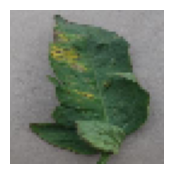

1/1 [==============================] - 0s 288ms/step
Model: Model 1
Predicted Label: Tomato___Bacterial_spot
True Label: Tomato___Bacterial_spot
Confidence Score: 0.9989033

1/1 [==============================] - 0s 51ms/step
Model: Model 2
Predicted Label: Tomato___Bacterial_spot
True Label: Tomato___Bacterial_spot
Confidence Score: 0.5244234

---


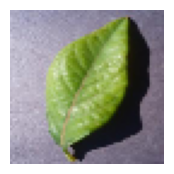

1/1 [==============================] - 0s 8ms/step
Model: Model 1
Predicted Label: Blueberry___healthy
True Label: Blueberry___healthy
Confidence Score: 0.94209033

1/1 [==============================] - 0s 9ms/step
Model: Model 2
Predicted Label: Blueberry___healthy
True Label: Blueberry___healthy
Confidence Score: 0.98234093

---


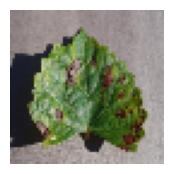

1/1 [==============================] - 0s 35ms/step
Model: Model 1
Predicted Label: Grape___Esca_(Black_Measles)
True Label: Grape___Esca_(Black_Measles)
Confidence Score: 0.99359787

1/1 [==============================] - 0s 8ms/step
Model: Model 2
Predicted Label: Grape___Esca_(Black_Measles)
True Label: Grape___Esca_(Black_Measles)
Confidence Score: 0.6364073

---


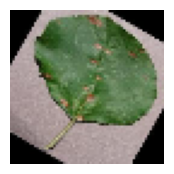

1/1 [==============================] - 0s 9ms/step
Model: Model 1
Predicted Label: Apple___Black_rot
True Label: Apple___Black_rot
Confidence Score: 1.0

1/1 [==============================] - 0s 7ms/step
Model: Model 2
Predicted Label: Apple___Black_rot
True Label: Apple___Black_rot
Confidence Score: 0.9943944

---


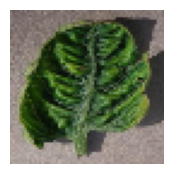

1/1 [==============================] - 0s 8ms/step
Model: Model 1
Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus
True Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Confidence Score: 1.0

1/1 [==============================] - 0s 31ms/step
Model: Model 2
Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus
True Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Confidence Score: 0.9998368

---


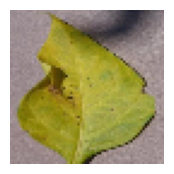

1/1 [==============================] - 0s 36ms/step
Model: Model 1
Predicted Label: Pepper,_bell___Bacterial_spot
True Label: Pepper,_bell___Bacterial_spot
Confidence Score: 0.81853455

1/1 [==============================] - 0s 14ms/step
Model: Model 2
Predicted Label: Pepper,_bell___Bacterial_spot
True Label: Pepper,_bell___Bacterial_spot
Confidence Score: 0.7014218

---


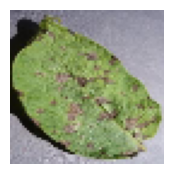

1/1 [==============================] - 0s 10ms/step
Model: Model 1
Predicted Label: Potato___Early_blight
True Label: Potato___Early_blight
Confidence Score: 0.9999956

1/1 [==============================] - 0s 8ms/step
Model: Model 2
Predicted Label: Potato___Early_blight
True Label: Potato___Early_blight
Confidence Score: 0.9970138

---


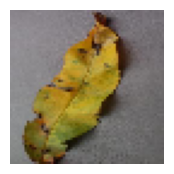

1/1 [==============================] - 0s 10ms/step
Model: Model 1
Predicted Label: Peach___Bacterial_spot
True Label: Peach___Bacterial_spot
Confidence Score: 0.9951408

1/1 [==============================] - 0s 9ms/step
Model: Model 2
Predicted Label: Peach___Bacterial_spot
True Label: Peach___Bacterial_spot
Confidence Score: 0.99936444

---


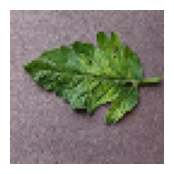

1/1 [==============================] - 0s 8ms/step
Model: Model 1
Predicted Label: Tomato___Tomato_mosaic_virus
True Label: Tomato___Tomato_mosaic_virus
Confidence Score: 0.93396634

1/1 [==============================] - 0s 8ms/step
Model: Model 2
Predicted Label: Tomato___Tomato_mosaic_virus
True Label: Tomato___Tomato_mosaic_virus
Confidence Score: 0.9656308

---


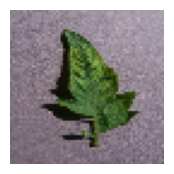

1/1 [==============================] - 0s 15ms/step
Model: Model 1
Predicted Label: Tomato___Tomato_mosaic_virus
True Label: Tomato___Tomato_mosaic_virus
Confidence Score: 0.9404433

1/1 [==============================] - 0s 8ms/step
Model: Model 2
Predicted Label: Tomato___Tomato_mosaic_virus
True Label: Tomato___Tomato_mosaic_virus
Confidence Score: 0.89711785

---


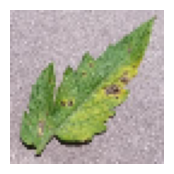

1/1 [==============================] - 0s 7ms/step
Model: Model 1
Predicted Label: Tomato___Septoria_leaf_spot
True Label: Tomato___Septoria_leaf_spot
Confidence Score: 0.61112875

1/1 [==============================] - 0s 7ms/step
Model: Model 2
Predicted Label: Tomato___Septoria_leaf_spot
True Label: Tomato___Septoria_leaf_spot
Confidence Score: 0.6470387

---


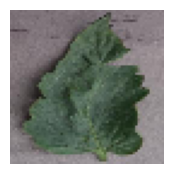

1/1 [==============================] - 0s 15ms/step
Model: Model 1
Predicted Label: Tomato___Bacterial_spot
True Label: Tomato___Bacterial_spot
Confidence Score: 0.99762446

1/1 [==============================] - 0s 8ms/step
Model: Model 2
Predicted Label: Tomato___Target_Spot
True Label: Tomato___Bacterial_spot
Confidence Score: 0.8215652

---


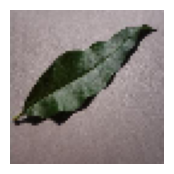

1/1 [==============================] - 0s 8ms/step
Model: Model 1
Predicted Label: Peach___healthy
True Label: Peach___healthy
Confidence Score: 0.9999486

1/1 [==============================] - 0s 8ms/step
Model: Model 2
Predicted Label: Peach___healthy
True Label: Peach___healthy
Confidence Score: 0.97366637

---


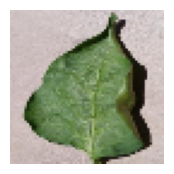

1/1 [==============================] - 0s 14ms/step
Model: Model 1
Predicted Label: Pepper,_bell___healthy
True Label: Pepper,_bell___healthy
Confidence Score: 0.816197

1/1 [==============================] - 0s 11ms/step
Model: Model 2
Predicted Label: Pepper,_bell___healthy
True Label: Pepper,_bell___healthy
Confidence Score: 0.99980956

---


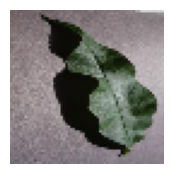

1/1 [==============================] - 0s 9ms/step
Model: Model 1
Predicted Label: Peach___healthy
True Label: Peach___healthy
Confidence Score: 0.9998765

1/1 [==============================] - 0s 8ms/step
Model: Model 2
Predicted Label: Peach___healthy
True Label: Peach___healthy
Confidence Score: 0.8045465

---


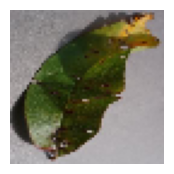

1/1 [==============================] - 0s 10ms/step
Model: Model 1
Predicted Label: Peach___Bacterial_spot
True Label: Peach___Bacterial_spot
Confidence Score: 0.98013777

1/1 [==============================] - 0s 9ms/step
Model: Model 2
Predicted Label: Peach___Bacterial_spot
True Label: Peach___Bacterial_spot
Confidence Score: 0.49981415

---


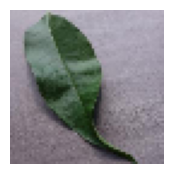

1/1 [==============================] - 0s 10ms/step
Model: Model 1
Predicted Label: Peach___Bacterial_spot
True Label: Peach___healthy
Confidence Score: 0.35153776

1/1 [==============================] - 0s 9ms/step
Model: Model 2
Predicted Label: Peach___healthy
True Label: Peach___healthy
Confidence Score: 0.26190197

---


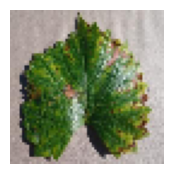

1/1 [==============================] - 0s 10ms/step
Model: Model 1
Predicted Label: Grape___Esca_(Black_Measles)
True Label: Grape___Esca_(Black_Measles)
Confidence Score: 0.9999825

1/1 [==============================] - 0s 9ms/step
Model: Model 2
Predicted Label: Grape___Esca_(Black_Measles)
True Label: Grape___Esca_(Black_Measles)
Confidence Score: 0.87568766

---


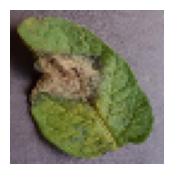

1/1 [==============================] - 0s 9ms/step
Model: Model 1
Predicted Label: Potato___Late_blight
True Label: Potato___Late_blight
Confidence Score: 0.82962424

1/1 [==============================] - 0s 10ms/step
Model: Model 2
Predicted Label: Potato___Late_blight
True Label: Potato___Late_blight
Confidence Score: 0.8828577

---


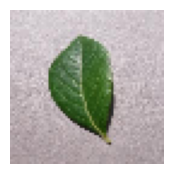

1/1 [==============================] - 0s 8ms/step
Model: Model 1
Predicted Label: Blueberry___healthy
True Label: Blueberry___healthy
Confidence Score: 0.9907251

1/1 [==============================] - 0s 9ms/step
Model: Model 2
Predicted Label: Blueberry___healthy
True Label: Blueberry___healthy
Confidence Score: 0.94679856

---


In [76]:
for i in range(0, 20):
    random_index = np.random.randint(0, len(X_test))
    test_and_plot([model1, model2], ['Model 1', 'Model 2'], random_index)
    print('---')